In [2]:
#importing important libraries
import pandas as pd
import re # for regular expressions
import nltk
import matplotlib.pyplot as plt


In [4]:
#Uploading Mcdonald's review dataset
md=pd.read_csv(r'C:\Users\DIKSHA\OneDrive\Desktop\NLP_Hotel reviews analysis\McDonalds-Yelp-Sentiment-DFE.csv')

In [5]:
#checking data columns 
md.head()

,_unit_id,_golden,_unit_state,_trusted_judgments,_last_judgment_at,policies_violated,policies_violated:confidence,city,policies_violated_gold,review
0,679455653,False,finalized,3,2/21/15 0:36,RudeService\rOrderProblem\rFilthy,1.0\r0.6667\r0.6667,Atlanta,NaN,"I'm not a huge mcds lover, but I've been to be..."
1,679455654,False,finalized,3,2/21/15 0:27,RudeService,1,Atlanta,NaN,Terrible customer service. ξI came in at 9:30p...
2,679455655,False,finalized,3,2/21/15 0:26,SlowService\rOrderProblem,1.0\r1.0,Atlanta,NaN,"First they ""lost"" my order, actually they gave..."
3,679455656,False,finalized,3,2/21/15 0:27,na,0.6667,Atlanta,NaN,I see I'm not the only one giving 1 star. Only...
4,679455657,False,finalized,3,2/21/15 0:27,RudeService,1,Atlanta,NaN,"Well, it's McDonald's, so you know what the fo..."


In [6]:
#checking datatype information of datsset
md.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1525 entries, 0 to 1524
Data columns (total 10 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   _unit_id                      1525 non-null   int64  
 1   _golden                       1525 non-null   bool   
 2   _unit_state                   1525 non-null   object 
 3   _trusted_judgments            1525 non-null   int64  
 4   _last_judgment_at             1525 non-null   object 
 5   policies_violated             1471 non-null   object 
 6   policies_violated:confidence  1471 non-null   object 
 7   city                          1438 non-null   object 
 8   policies_violated_gold        0 non-null      float64
 9   review                        1525 non-null   object 
dtypes: bool(1), float64(1), int64(2), object(6)
memory usage: 108.8+ KB


In [7]:
#since we are concencerned with review column ,we assigned it to variable x
x=md['review']
print(x)

0       I'm not a huge mcds lover, but I've been to be...
1       Terrible customer service. ξI came in at 9:30p...
2       First they "lost" my order, actually they gave...
3       I see I'm not the only one giving 1 star. Only...
4       Well, it's McDonald's, so you know what the fo...
                              ...                        
1520    I enjoyed the part where I repeatedly asked if...
1521    Worst McDonalds I've been in in a long time! D...
1522    When I am really craving for McDonald's, this ...
1523    Two points right out of the gate: 1. Thuggery ...
1524    I wanted to grab breakfast one morning before ...
Name: review, Length: 1525, dtype: object


In [8]:
#dropping least useful columns from the dataset for better analysis
md.drop(["_unit_id","_golden","policies_violated","_last_judgment_at","_unit_state","_trusted_judgments","policies_violated:confidence","policies_violated_gold"], axis=1)

,city,review
0,Atlanta,"I'm not a huge mcds lover, but I've been to be..."
1,Atlanta,Terrible customer service. ξI came in at 9:30p...
2,Atlanta,"First they ""lost"" my order, actually they gave..."
3,Atlanta,I see I'm not the only one giving 1 star. Only...
4,Atlanta,"Well, it's McDonald's, so you know what the fo..."
...,...,...
1520,Portland,I enjoyed the part where I repeatedly asked if...
1521,Houston,Worst McDonalds I've been in in a long time! D...
1522,New York,"When I am really craving for McDonald's, this ..."
1523,Chicago,Two points right out of the gate: 1. Thuggery ...


In [9]:
#DATA PRE-PROCESSING
#lowercase removal from x =md["reviews"]
x = [r.lower() for r in x]
print(x)

["i'm not a huge mcds lover, but i've been to better ones. this is by far the worst one i've ever been too! it's filthy inside and if you get drive through they completely screw up your order every time! the staff is terribly unfriendly and nobody seems to care.", 'terrible customer service. ξi came in at 9:30pm and stood in front of the register and no one bothered to say anything or help me for 5 minutes. ξthere was no one else waiting for their food inside either, just outside at the window. ξ i left and went to chickfila next door and was greeted before i was all the way inside. this mcdonalds is also dirty, the floor was covered with dropped food. obviously filled with surly and unhappy workers.', 'first they "lost" my order, actually they gave it to someone one else than took 20 minutes to figure out why i was still waiting for my order.they after i was asked what i needed i replied, "my order".they asked for my ticket and the asst mgr looked at the ticket then incompletely fille

In [10]:
 #converting list to string for sentence tokenizations step using for loop 
def listToString(s): 
    str1 = ""   
    for i in s: 
        str1 += i   
    return str1 
                   
s=md['review']
print(listToString(s))



I'm not a huge mcds lover, but I've been to better ones. This is by far the worst one I've ever been too! It's filthy inside and if you get drive through they completely screw up your order every time! The staff is terribly unfriendly and nobody seems to care.Terrible customer service. ξI came in at 9:30pm and stood in front of the register and no one bothered to say anything or help me for 5 minutes. ξThere was no one else waiting for their food inside either, just outside at the window. ξ I left and went to Chickfila next door and was greeted before I was all the way inside. This McDonalds is also dirty, the floor was covered with dropped food. Obviously filled with surly and unhappy workers.First they "lost" my order, actually they gave it to someone one else than took 20 minutes to figure out why I was still waiting for my order.They after I was asked what I needed I replied, "my order".They asked for my ticket and the asst mgr looked at the ticket then incompletely filled it.I had

In [11]:
m=listToString(s)
print(m)

I'm not a huge mcds lover, but I've been to better ones. This is by far the worst one I've ever been too! It's filthy inside and if you get drive through they completely screw up your order every time! The staff is terribly unfriendly and nobody seems to care.Terrible customer service. ξI came in at 9:30pm and stood in front of the register and no one bothered to say anything or help me for 5 minutes. ξThere was no one else waiting for their food inside either, just outside at the window. ξ I left and went to Chickfila next door and was greeted before I was all the way inside. This McDonalds is also dirty, the floor was covered with dropped food. Obviously filled with surly and unhappy workers.First they "lost" my order, actually they gave it to someone one else than took 20 minutes to figure out why I was still waiting for my order.They after I was asked what I needed I replied, "my order".They asked for my ticket and the asst mgr looked at the ticket then incompletely filled it.I had

In [12]:
#sentence tokenization for sentiment analysis
from nltk.tokenize import sent_tokenize
Sentence=sent_tokenize(m)
print(Sentence)

["I'm not a huge mcds lover, but I've been to better ones.", "This is by far the worst one I've ever been too!", "It's filthy inside and if you get drive through they completely screw up your order every time!", 'The staff is terribly unfriendly and nobody seems to care.Terrible customer service.', 'ξI came in at 9:30pm and stood in front of the register and no one bothered to say anything or help me for 5 minutes.', 'ξThere was no one else waiting for their food inside either, just outside at the window.', 'ξ I left and went to Chickfila next door and was greeted before I was all the way inside.', 'This McDonalds is also dirty, the floor was covered with dropped food.', 'Obviously filled with surly and unhappy workers.First they "lost" my order, actually they gave it to someone one else than took 20 minutes to figure out why I was still waiting for my order.They after I was asked what I needed I replied, "my order".They asked for my ticket and the asst mgr looked at the ticket then in

In [13]:
#importing textblob for sentiment analysis of the reviews
#since polarity is positive, reviews are not negative
#subjectivity is 0.5 , so it moderatley contains personal opinions
import textblob
from textblob import TextBlob
#sentiment of overall reviews
print(TextBlob(m).sentiment)

Sentiment(polarity=0.0173479726103007, subjectivity=0.515798441466837)


In [14]:
#Removal of special characters from the reviws for better analysis
import re
m=re.sub('[^A-Za-z0-9.]+', ' ',m)
print(m)

I m not a huge mcds lover but I ve been to better ones. This is by far the worst one I ve ever been too It s filthy inside and if you get drive through they completely screw up your order every time The staff is terribly unfriendly and nobody seems to care.Terrible customer service. I came in at 9 30pm and stood in front of the register and no one bothered to say anything or help me for 5 minutes. There was no one else waiting for their food inside either just outside at the window. I left and went to Chickfila next door and was greeted before I was all the way inside. This McDonalds is also dirty the floor was covered with dropped food. Obviously filled with surly and unhappy workers.First they lost my order actually they gave it to someone one else than took 20 minutes to figure out why I was still waiting for my order.They after I was asked what I needed I replied my order .They asked for my ticket and the asst mgr looked at the ticket then incompletely filled it.I had to ask her to

In [15]:
#tokenization of words to for further breaking them using lemmetization, inorder to given better context.
#tokenization
from nltk.tokenize import word_tokenize

x = word_tokenize(m)
print(x)

['I', 'm', 'not', 'a', 'huge', 'mcds', 'lover', 'but', 'I', 've', 'been', 'to', 'better', 'ones', '.', 'This', 'is', 'by', 'far', 'the', 'worst', 'one', 'I', 've', 'ever', 'been', 'too', 'It', 's', 'filthy', 'inside', 'and', 'if', 'you', 'get', 'drive', 'through', 'they', 'completely', 'screw', 'up', 'your', 'order', 'every', 'time', 'The', 'staff', 'is', 'terribly', 'unfriendly', 'and', 'nobody', 'seems', 'to', 'care.Terrible', 'customer', 'service', '.', 'I', 'came', 'in', 'at', '9', '30pm', 'and', 'stood', 'in', 'front', 'of', 'the', 'register', 'and', 'no', 'one', 'bothered', 'to', 'say', 'anything', 'or', 'help', 'me', 'for', '5', 'minutes', '.', 'There', 'was', 'no', 'one', 'else', 'waiting', 'for', 'their', 'food', 'inside', 'either', 'just', 'outside', 'at', 'the', 'window', '.', 'I', 'left', 'and', 'went', 'to', 'Chickfila', 'next', 'door', 'and', 'was', 'greeted', 'before', 'I', 'was', 'all', 'the', 'way', 'inside', '.', 'This', 'McDonalds', 'is', 'also', 'dirty', 'the', 'flo

In [16]:
# importing library and assigning variable to stopwords for removal of stop words
from nltk.corpus import stopwords
stopword = nltk.corpus.stopwords.words('english')


In [17]:
#removing stopwords
from nltk.corpus import stopwords
stopword = stopwords.words("english")
#removed stopwords
RS= [i for i in x if i not in stopword]
print(RS)



['I', 'huge', 'mcds', 'lover', 'I', 'better', 'ones', '.', 'This', 'far', 'worst', 'one', 'I', 'ever', 'It', 'filthy', 'inside', 'get', 'drive', 'completely', 'screw', 'order', 'every', 'time', 'The', 'staff', 'terribly', 'unfriendly', 'nobody', 'seems', 'care.Terrible', 'customer', 'service', '.', 'I', 'came', '9', '30pm', 'stood', 'front', 'register', 'one', 'bothered', 'say', 'anything', 'help', '5', 'minutes', '.', 'There', 'one', 'else', 'waiting', 'food', 'inside', 'either', 'outside', 'window', '.', 'I', 'left', 'went', 'Chickfila', 'next', 'door', 'greeted', 'I', 'way', 'inside', '.', 'This', 'McDonalds', 'also', 'dirty', 'floor', 'covered', 'dropped', 'food', '.', 'Obviously', 'filled', 'surly', 'unhappy', 'workers.First', 'lost', 'order', 'actually', 'gave', 'someone', 'one', 'else', 'took', '20', 'minutes', 'figure', 'I', 'still', 'waiting', 'order.They', 'I', 'asked', 'I', 'needed', 'I', 'replied', 'order', '.They', 'asked', 'ticket', 'asst', 'mgr', 'looked', 'ticket', 'inc

In [18]:
#lemmetization of words using for loop 
from nltk.stem import WordNetLemmatizer

wl=WordNetLemmatizer()

for i in range(len(RS)):
    RS[i]=wl.lemmatize(RS[i])
    
print(RS)



['I', 'huge', 'mcds', 'lover', 'I', 'better', 'one', '.', 'This', 'far', 'worst', 'one', 'I', 'ever', 'It', 'filthy', 'inside', 'get', 'drive', 'completely', 'screw', 'order', 'every', 'time', 'The', 'staff', 'terribly', 'unfriendly', 'nobody', 'seems', 'care.Terrible', 'customer', 'service', '.', 'I', 'came', '9', '30pm', 'stood', 'front', 'register', 'one', 'bothered', 'say', 'anything', 'help', '5', 'minute', '.', 'There', 'one', 'else', 'waiting', 'food', 'inside', 'either', 'outside', 'window', '.', 'I', 'left', 'went', 'Chickfila', 'next', 'door', 'greeted', 'I', 'way', 'inside', '.', 'This', 'McDonalds', 'also', 'dirty', 'floor', 'covered', 'dropped', 'food', '.', 'Obviously', 'filled', 'surly', 'unhappy', 'workers.First', 'lost', 'order', 'actually', 'gave', 'someone', 'one', 'else', 'took', '20', 'minute', 'figure', 'I', 'still', 'waiting', 'order.They', 'I', 'asked', 'I', 'needed', 'I', 'replied', 'order', '.They', 'asked', 'ticket', 'asst', 'mgr', 'looked', 'ticket', 'incomp

In [19]:
#removal of punctuation from reviews
import string
s=string.punctuation
print(s)

#removed punctuation
RX= [i for i in RS if i not in s]
print(len(RX))
print(RX)

!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~
84260
['I', 'huge', 'mcds', 'lover', 'I', 'better', 'one', 'This', 'far', 'worst', 'one', 'I', 'ever', 'It', 'filthy', 'inside', 'get', 'drive', 'completely', 'screw', 'order', 'every', 'time', 'The', 'staff', 'terribly', 'unfriendly', 'nobody', 'seems', 'care.Terrible', 'customer', 'service', 'I', 'came', '9', '30pm', 'stood', 'front', 'register', 'one', 'bothered', 'say', 'anything', 'help', '5', 'minute', 'There', 'one', 'else', 'waiting', 'food', 'inside', 'either', 'outside', 'window', 'I', 'left', 'went', 'Chickfila', 'next', 'door', 'greeted', 'I', 'way', 'inside', 'This', 'McDonalds', 'also', 'dirty', 'floor', 'covered', 'dropped', 'food', 'Obviously', 'filled', 'surly', 'unhappy', 'workers.First', 'lost', 'order', 'actually', 'gave', 'someone', 'one', 'else', 'took', '20', 'minute', 'figure', 'I', 'still', 'waiting', 'order.They', 'I', 'asked', 'I', 'needed', 'I', 'replied', 'order', '.They', 'asked', 'ticket', 'asst', 'mgr', 'looked', 'ticket'

In [20]:
#removal of text with less that 3 length size 
#removal of text
RT= [i for i in RX if len(i) > 3]
print(len(RT))
print(RT)


64082
['huge', 'mcds', 'lover', 'better', 'This', 'worst', 'ever', 'filthy', 'inside', 'drive', 'completely', 'screw', 'order', 'every', 'time', 'staff', 'terribly', 'unfriendly', 'nobody', 'seems', 'care.Terrible', 'customer', 'service', 'came', '30pm', 'stood', 'front', 'register', 'bothered', 'anything', 'help', 'minute', 'There', 'else', 'waiting', 'food', 'inside', 'either', 'outside', 'window', 'left', 'went', 'Chickfila', 'next', 'door', 'greeted', 'inside', 'This', 'McDonalds', 'also', 'dirty', 'floor', 'covered', 'dropped', 'food', 'Obviously', 'filled', 'surly', 'unhappy', 'workers.First', 'lost', 'order', 'actually', 'gave', 'someone', 'else', 'took', 'minute', 'figure', 'still', 'waiting', 'order.They', 'asked', 'needed', 'replied', 'order', '.They', 'asked', 'ticket', 'asst', 'looked', 'ticket', 'incompletely', 'filled', 'it.I', 'check', 'filled', 'correctly.She', 'acted', 'bothered', 'asked', 'again.She', 'begrudgingly', 'checked', 'fact', 'miss', 'something', 'ticket.So'

In [21]:
#removal of numbers from the data
RT= [i for i in RT if not any(c.isdigit() for c in i)]
print(len(RT))
print(RT)

63819
['huge', 'mcds', 'lover', 'better', 'This', 'worst', 'ever', 'filthy', 'inside', 'drive', 'completely', 'screw', 'order', 'every', 'time', 'staff', 'terribly', 'unfriendly', 'nobody', 'seems', 'care.Terrible', 'customer', 'service', 'came', 'stood', 'front', 'register', 'bothered', 'anything', 'help', 'minute', 'There', 'else', 'waiting', 'food', 'inside', 'either', 'outside', 'window', 'left', 'went', 'Chickfila', 'next', 'door', 'greeted', 'inside', 'This', 'McDonalds', 'also', 'dirty', 'floor', 'covered', 'dropped', 'food', 'Obviously', 'filled', 'surly', 'unhappy', 'workers.First', 'lost', 'order', 'actually', 'gave', 'someone', 'else', 'took', 'minute', 'figure', 'still', 'waiting', 'order.They', 'asked', 'needed', 'replied', 'order', '.They', 'asked', 'ticket', 'asst', 'looked', 'ticket', 'incompletely', 'filled', 'it.I', 'check', 'filled', 'correctly.She', 'acted', 'bothered', 'asked', 'again.She', 'begrudgingly', 'checked', 'fact', 'miss', 'something', 'ticket.So', 'minut

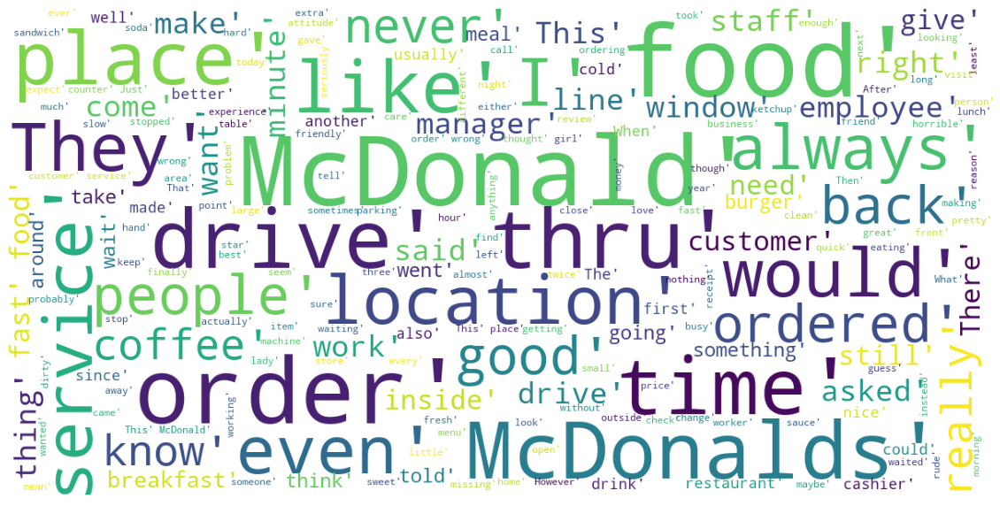

In [22]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color = 'white',
        max_words = 200,
        max_font_size = 40, 
        scale = 3,
        random_state = 42
    ).generate(str(data))

    fig = plt.figure(1, figsize = (20, 20))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize = 20)
        fig.subplots_adjust(top = 2.3)

    plt.imshow(wordcloud)
    plt.show()
show_wordcloud(RT)

In [23]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
sa=analyzer.polarity_scores(Sentence)
print(sa)

{'neg': 0.086, 'neu': 0.823, 'pos': 0.091, 'compound': 1.0}


In [24]:
#sentiment analysis using Vader 

for j in Sentence:
    print(analyzer.polarity_scores(j))

{'neg': 0.089, 'neu': 0.538, 'pos': 0.374, 'compound': 0.6974}
{'neg': 0.305, 'neu': 0.695, 'pos': 0.0, 'compound': -0.6588}
{'neg': 0.11, 'neu': 0.89, 'pos': 0.0, 'compound': -0.2465}
{'neg': 0.379, 'neu': 0.621, 'pos': 0.0, 'compound': -0.7269}
{'neg': 0.076, 'neu': 0.762, 'pos': 0.162, 'compound': 0.3532}
{'neg': 0.128, 'neu': 0.872, 'pos': 0.0, 'compound': -0.296}
{'neg': 0.0, 'neu': 0.896, 'pos': 0.104, 'compound': 0.2732}
{'neg': 0.209, 'neu': 0.791, 'pos': 0.0, 'compound': -0.4404}
{'neg': 0.051, 'neu': 0.899, 'pos': 0.05, 'compound': -0.0098}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.307, 'neu': 0.693, 'pos': 0.0, 'compound': -0.4767}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.304, 'neu': 0.696, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.217, 'neu': 0.783, 'pos': 0.0, 'compound': -0.6761}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.822, 'pos': 0.178, 